In [1]:
import keras
import numpy as np
import matplotlib.pyplot as plt
import numpy_gpu as npg

from keras.preprocessing.image import load_img, img_to_array
from keras.applications import vgg19
from keras.layers import Flatten, Dense
from keras.models import Model
import keras.backend as K

import pandas as pd

import os
import sys
import gc
import time
import tensorflow as tf
import keras.backend.tensorflow_backend as KTF

# 指定第一块GPU可用 
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
 
config = tf.ConfigProto()  
config.gpu_options.allow_growth=True   #不全部占满显存, 按需分配
sess = tf.Session(config=config)
 
KTF.set_session(sess)

Using TensorFlow backend.


In [2]:
img_dir = "/home/hpyan/DataVisualization/imgs/"

img_height = 150
img_width = 200

In [3]:
from numba import jit

@jit(parallel=True)
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_height, img_width))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = vgg19.preprocess_input(img)
    return img

In [4]:
base_image_tensor = K.placeholder((1, img_height, img_width, 3))
target_image_tensor = K.placeholder((1, img_height, img_width, 3))

my_input_tensor = K.concatenate([base_image_tensor, target_image_tensor], axis=0)

base_model = vgg19.VGG19(
    input_tensor=my_input_tensor,
    weights='imagenet', 
    include_top=False
)

outputs_dict = dict([
    (layer.name, layer.output) for layer in base_model.layers
])

content_layer = 'block5_conv2'

style_layers = [
    'block1_conv1', 
    'block2_conv1', 
    'block3_conv1', 
    'block4_conv1', 
    'block5_conv1' 
]

Instructions for updating:
Colocations handled automatically by placer.


In [5]:
from keras.layers import Layer

def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram

def content_loss(base, target):
    return K.sum(K.square(target - base))

def style_loss(base, target):
    B = gram_matrix(base)
    T = gram_matrix(target)
    channels = 3
    size = img_height * img_width
    return K.sum(K.square(B - T)) / (4. * (channels ** 2) * (size ** 2))

def total_variation_loss(x):
    a = K.square(
        x[:, :img_height - 1, :img_width - 1, :] - x[:, 1:, :img_width - 1, :])
    b = K.square(
        x[:, :img_height - 1, :img_width - 1, :] - x[:, :img_height - 1, 1:, :])
    return K.sum(K.pow(a + b, 1.25))

style_weight = 1.
content_weight = 0.025
total_variation_weight = 1e-4

loss = K.variable(0.)

content_features = outputs_dict[content_layer]
base_content_feature = content_features[0, :, :, :]
target_content_feature = content_features[1, :, :, :]

loss = loss + content_weight * style_loss(base_content_feature, target_content_feature)

    
for layer_name in style_layers:
    style_features = outputs_dict[layer_name]
    base_style_feature = style_features[0, :, :, :]
    target_style_feature =  style_features[1, :, :, :]
    loss = loss + (style_weight / len(style_layers)) * style_loss(base_style_feature, target_style_feature)

loss = loss + total_variation_weight * total_variation_loss(my_input_tensor[1:, :, :, :])

f = K.function([base_model.input], [loss])

In [6]:
@jit(parallel=True)
def read_img_data(filename):
    img_path = img_dir + filename
    return preprocess_image(img_path)

xls_path = "/home/hpyan/DataVisualization/data.xls"

data = pd.read_excel(xls_path)

data['filename'] = "bigger" + data['filename']
data['img_data'] = data['filename'].apply(read_img_data)

In [68]:
img_idx = np.random.randint(0, data.shape[0])
base_image_path = data.loc[img_idx, 'filename']
base_image_data = preprocess_image(img_dir + base_image_path)

In [84]:
@jit(parallel=True)
def get_diff(base, target):
    return f([np.concatenate([base, target], axis=0)])[0]

st = time.time()
data['diff'] = data['img_data'].apply(lambda x: get_diff(base_image_data, x))
et = time.time()
print("Time cost: {}".format(et - st))
gc.collect()

Time cost: 94.59208583831787


102158

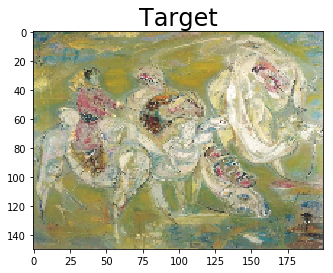

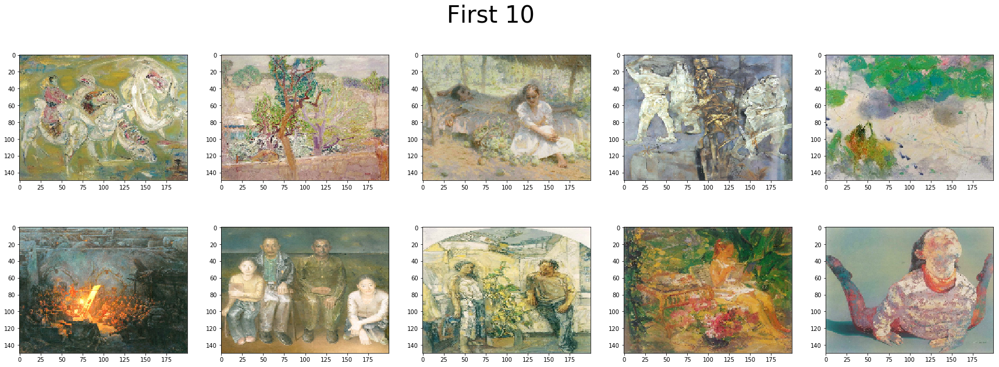

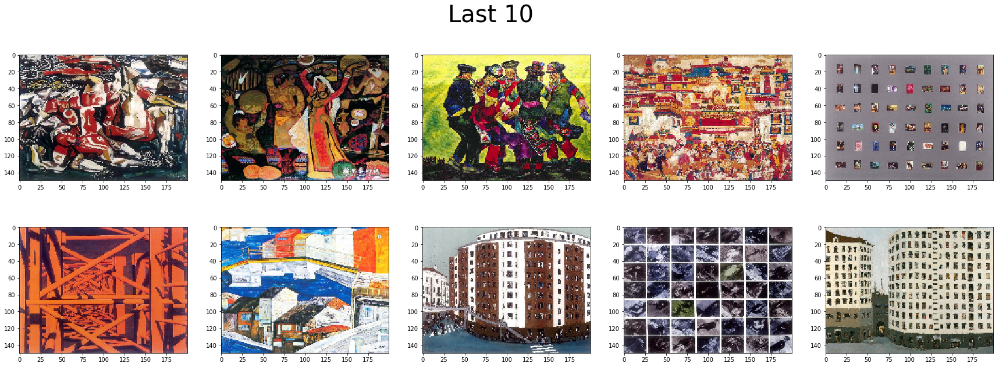

In [85]:
diff_data = data[['filename', 'diff']]
diff_data = diff_data.sort_values('diff', ascending=True)

plt.imshow(load_img(img_dir + base_image_path, target_size=(img_height, img_width)))
plt.title("Target", fontsize=24, y=1.0)

fig, axes = plt.subplots(2, 5, figsize=(30, 10))
fig.suptitle("First 10", fontsize=40, x=0.5)

first_5 = diff_data.head(10)
for i, (ax, filename) in enumerate(zip(axes.ravel(), first_5['filename'])):
    img = load_img(img_dir + filename, target_size=(img_height, img_width))
    ax.imshow(img)

fig, axes = plt.subplots(2, 5, figsize=(30, 10))
fig.suptitle("Last 10", fontsize=40, x=0.5)

last_5 = diff_data.tail(10)
for i, (ax, filename) in enumerate(zip(axes.ravel(), last_5['filename'])):
    img = load_img(img_dir + filename, target_size=(img_height, img_width))
    ax.imshow(img)

In [86]:
diff_data.head()

,filename,diff
347,bigger004_9th_058_chahannuoer_chaokebatu.jpg,7.072928e+04
498,bigger004_9th_142_liubuchunzao_wangkeju.jpg,7.950368e+09
1569,bigger006_11th_227b_wufengdeguoyuan.jpg,8.439057e+09
245,bigger003_8th_92_canshengdeuoshi_sunzhiyi.jpg,8.725140e+09
1209,bigger005_10th_299_washeng_ouyang.jpg,8.942341e+09


In [87]:
diff_data.tail()

,filename,diff
1048,bigger005_10th_219_dagongyezhisanhongsejiliang...,3.973381e+11
155,bigger003_8th_111_shengchunhuanjingxiliekewang...,4.110622e+11
1729,bigger007_12th_066_kanbujiandechengshi_duhaiju...,6.965333e+11
1706,bigger007_12th_043_ouyu_sunjinggang_20_20_49.jpg,8.904113e+11
1229,bigger006_11th_020_dushiyingxiang.jpg,1.385323e+12


In [37]:
result_dir = "/home/hpyan/DataVisualization/results/"
data.filename.to_csv(result_dir + "filenames.csv", header=True)
# pd.read_csv(result_dir + "filenames.csv", index_col=0) # 读取文件顺序

In [97]:
def caculate_diff(filename):
    result_path = result_dir + filename[:-3] + "bk"
    if os.path.exists(result_path):
        print(filename + " exist, pass~")
    else:
        bg = time.time()
        base_image_data = preprocess_image(img_dir + filename)
        data['diff'] =  data['img_data'].apply(lambda x: get_diff(base_image_data, x))
        
        data[['filename', 'diff']].to_csv(result_path, index=False, header=True)
        ed = time.time()
        print("Completed: " + filename + ", time cost: {:.2f}".format(ed - bg)  + " second")
        return data[['filename', 'diff']]

In [ ]:
data['filename'].apply(caculate_diff)

In [94]:
def plot_result(diff_data, base_image_path=None, plot_first10=True, plot_last10=True):
    diff_data = diff_data.sort_values('diff', ascending=True)
    
    if base_image_path is not None:
        plt.title("Target", fontsize=24, y=1.0)
        plt.imshow(load_img(img_dir + base_image_path, target_size=(img_height, img_width)))
    
    if plot_first10:
        fig, axes = plt.subplots(2, 5, figsize=(30, 10))
        fig.suptitle("First 10", fontsize=40, x=0.5)

        first_10 = diff_data.head(10)
        for i, (ax, filename) in enumerate(zip(axes.ravel(), first_10['filename'])):
            img = load_img(img_dir + filename, target_size=(img_height, img_width))
            ax.imshow(img)
    
    if plot_last10:
        fig, axes = plt.subplots(2, 5, figsize=(30, 10))
        fig.suptitle("Last 10", fontsize=40, x=0.5)

        last_10 = diff_data.tail(10)
        for i, (ax, filename) in enumerate(zip(axes.ravel(), last_10['filename'])):
            img = load_img(img_dir + filename, target_size=(img_height, img_width))
            ax.imshow(img)

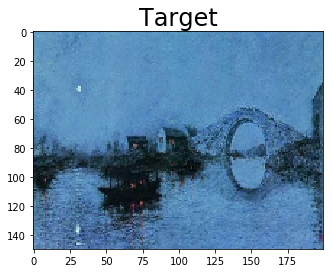

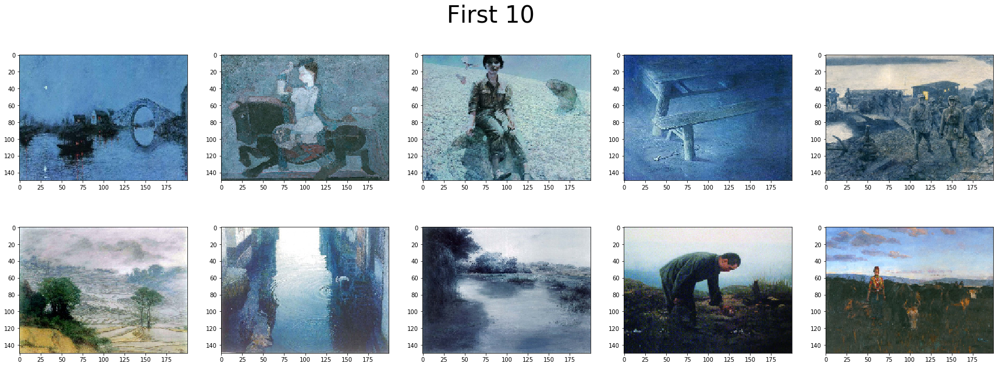

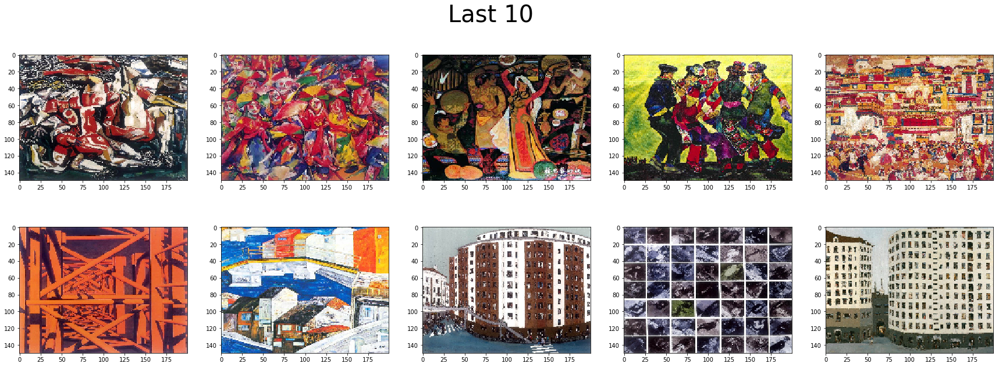

In [101]:
test_img_name = data.loc[2, "filename"]
diff_data = pd.read_csv(result_dir + test_img_name[:-3] + "bk")
plot_result(diff_data, test_img_name, True, True)

In [108]:
def test(test_img_name):
    tmp_path = result_dir + test_img_name[:-3] + "bk"
    if os.path.exists(tmp_path):
        diff_data = pd.read_csv(result_dir + test_img_name[:-3] + "bk")
    else:
        diff_data = caculate_diff(test_img_name)
    plot_result(diff_data, test_img_name, True, False)

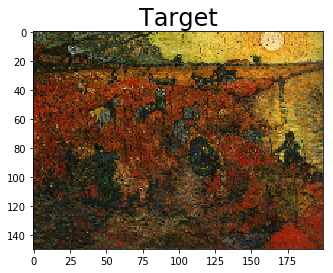

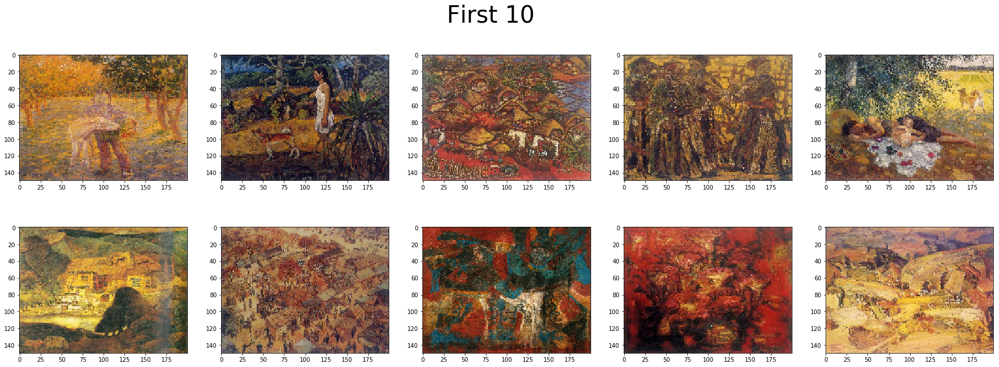

In [109]:
test_img_name = "../test_img/1.jpg"
test(test_img_name)

Completed: ../test_img/2.jpg, time cost: 93.73 second


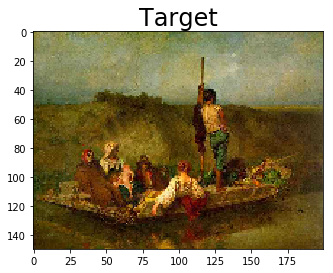

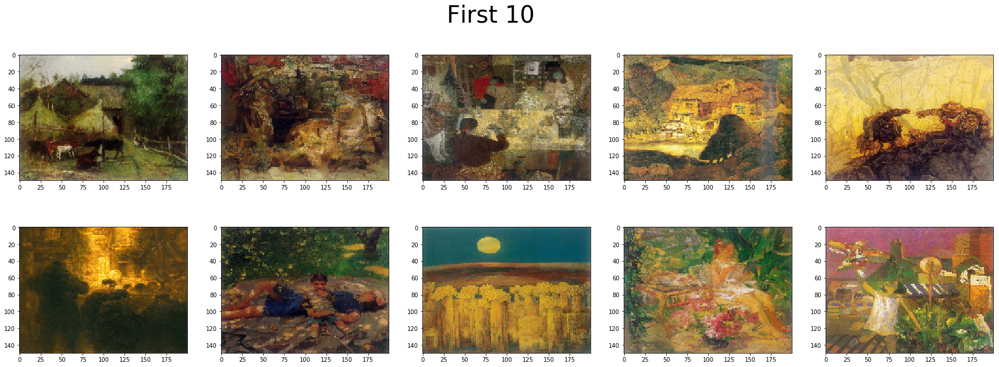

In [110]:
test_img_name = "../test_img/2.jpg"
test(test_img_name)

Completed: ../test_img/3.jpg, time cost: 93.79 second


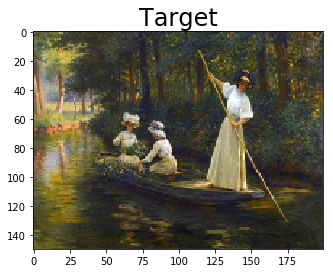

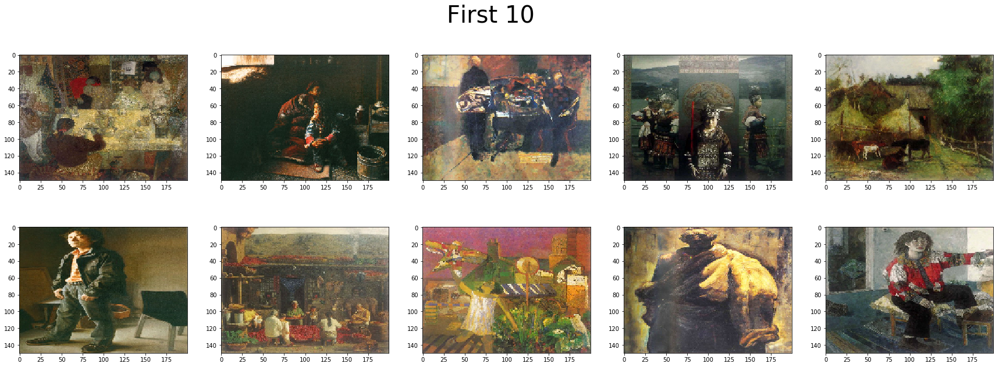

In [112]:
test_img_name = "../test_img/3.jpg"
test(test_img_name)

Completed: ../test_img/4.jpg, time cost: 95.45 second


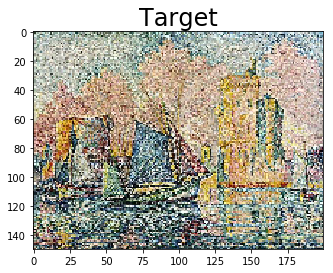

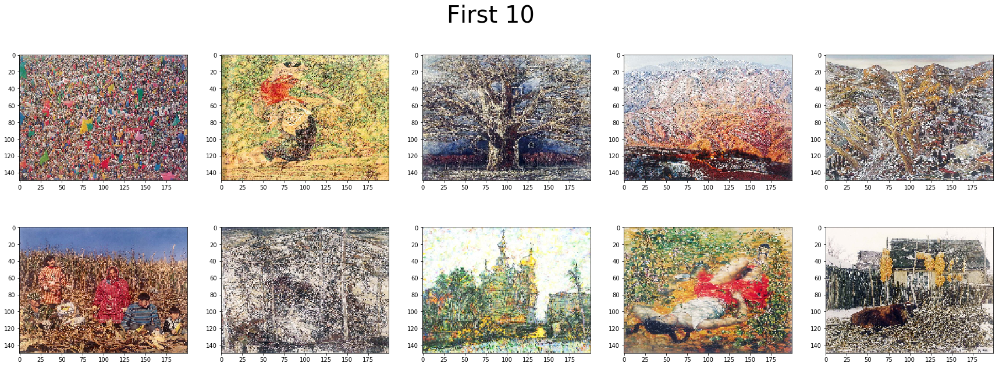

In [113]:
test_img_name = "../test_img/4.jpg"
test(test_img_name)

Completed: ../test_img/5.jpg, time cost: 96.01 second


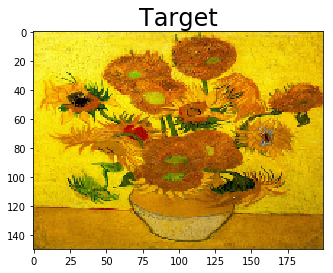

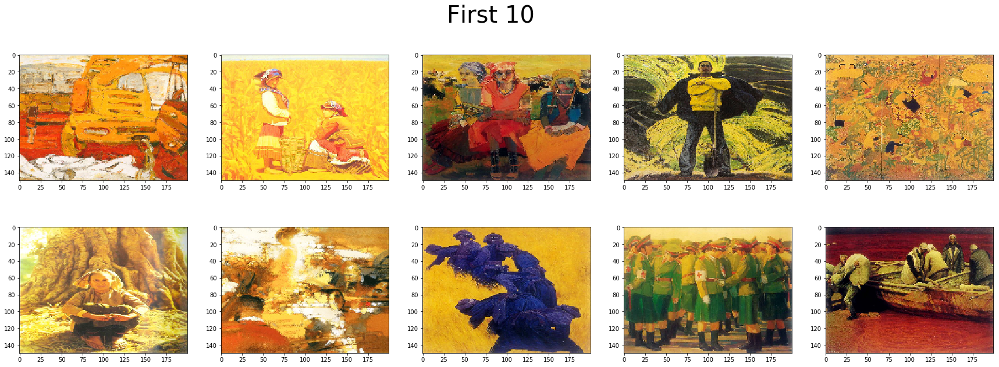

In [114]:
test_img_name = "../test_img/5.jpg"
test(test_img_name)

Completed: ../test_img/6.jpg, time cost: 96.36 second


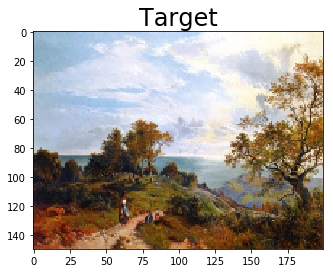

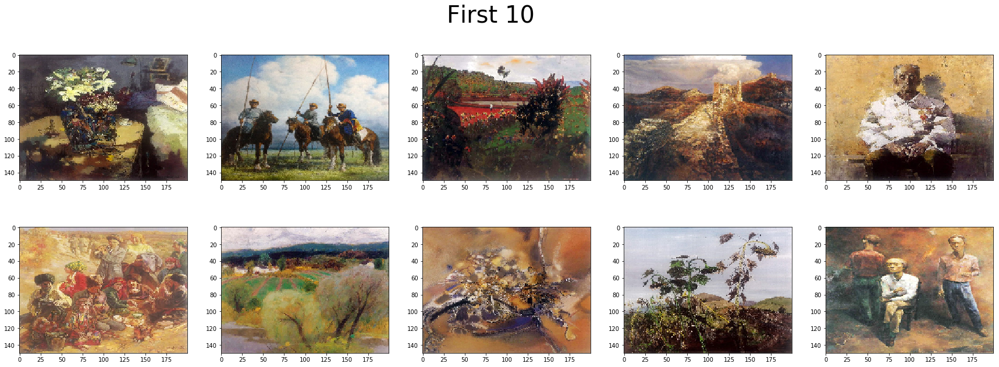

In [115]:
test_img_name = "../test_img/6.jpg"
test(test_img_name)

In [ ]:
from sklearn.cluster import KMeans
from skimage import io

n_clusters = 10
kmeans = KMeans(n_clusters)


@jit(parallel=True, nopython=True)
def caculate_colors(filaneme):
    image_path = img_dir + filename
    img = io.imread(image_path)
    shape_ori = img.shape

    #after reshape
    img = img.reshape(shape_ori[0] * shape_ori[1], shape_ori[2])
    kmeans.fit(img)
    
    print("ok~")
    return kmeans.cluster_centers_

In [ ]:
test_data = data[:100]
bg = time.time()
test_data["colors"] = test_data['filename'].apply(caculate_colors)
ed = time.time()
print("Time cost: {:.2f}".format(ed - bg))